In [1]:
from scipy.io import loadmat
import numpy as np
import pandas as pd
from mpl_toolkits import mplot3d
import matplotlib.pyplot as plt
from matplotlib import cm
import os
import glob
import re

In [2]:
from pathlib import Path
import os.path
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Activation, Dense, Flatten, BatchNormalization, Conv2D, MaxPool2D
from sklearn.metrics import r2_score

## Making a numpy array of all the filenames for the augmented data

In [22]:
filenames = glob.glob("DATA/*.csv")
# filenames
fn = np.array(filenames)
# fn

## Steps to convert signals to surface plot und danach saving the top view of the plot:

 Step 1. Extracting time signals to a separate numpy array, and same procedure is done for the sensor data (combining all the sensor data into a separate numpy array).
 
 Step 2. Creating a mesh grid in the X,Y plane .... with time array on the x axis and an array with 4 linearly separated values on the y axis (to represent 4 sensors).
 
 Step 3. Creating a surface plot with the xy plane's mesh grid and sensor data on z axis and saving the top view of the plot.
 
 Step 4. Doing this iteratively for all the csv files and converting them into images.
 
 z.B:




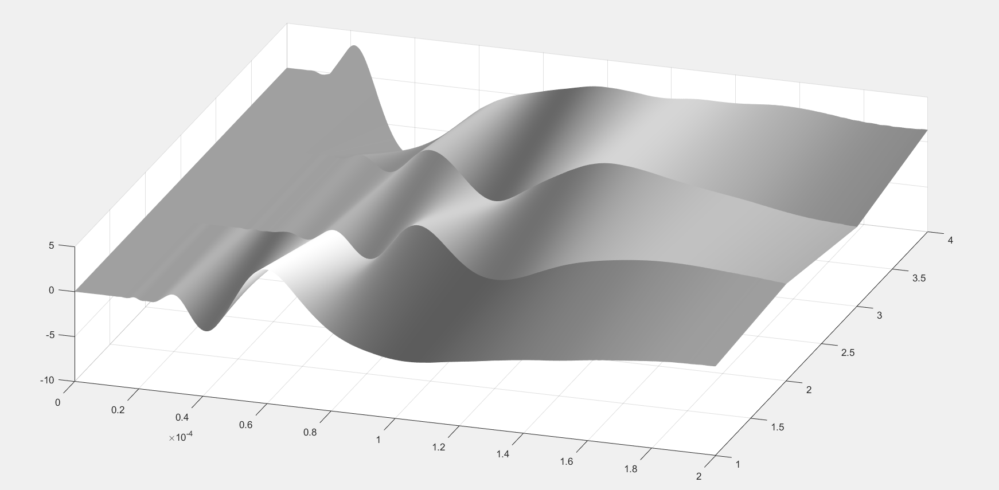

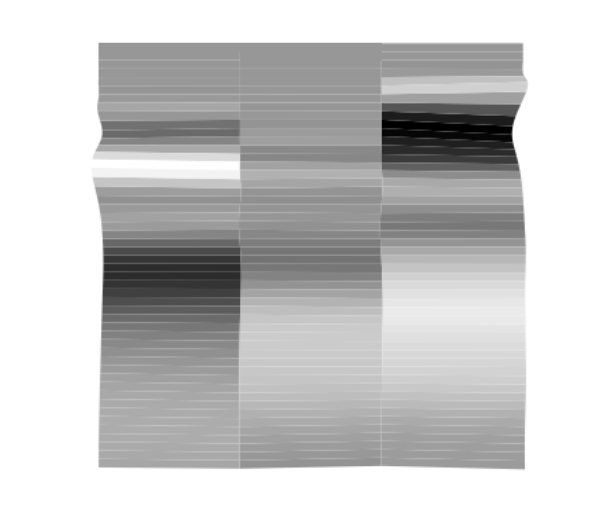

Unfortunately through python I am not able to get proper square as the true top view but some features of waves are also there.
Through matlab, it is possible to extract proper top view but there was some error in matlab which prevented me from doing this process iteratively (seems to be a matlab issue)

C:\Users\ratho\AppData\Local\Temp/ipykernel_4088/1194496616.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize = [15,10])


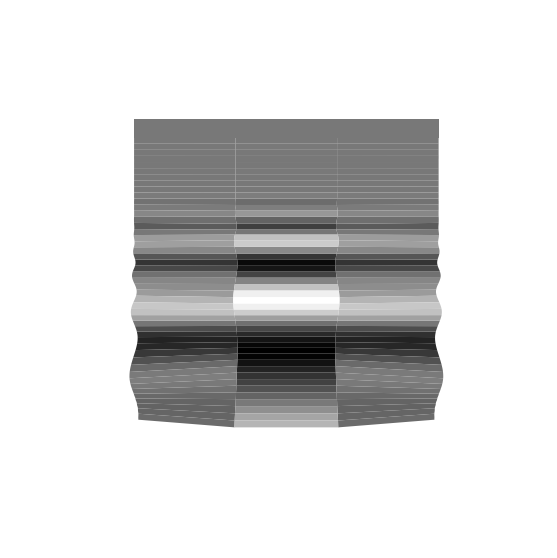

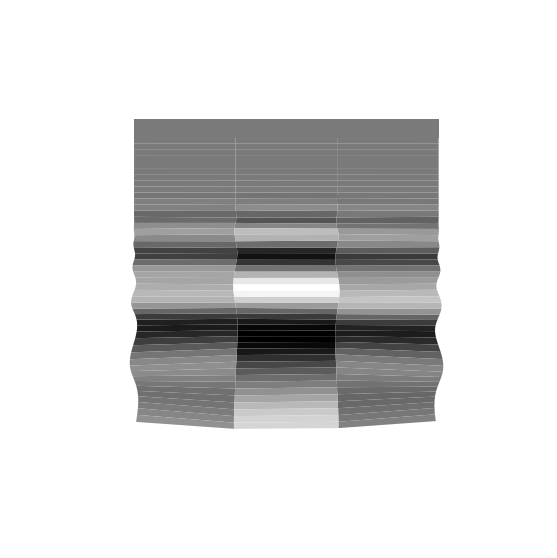

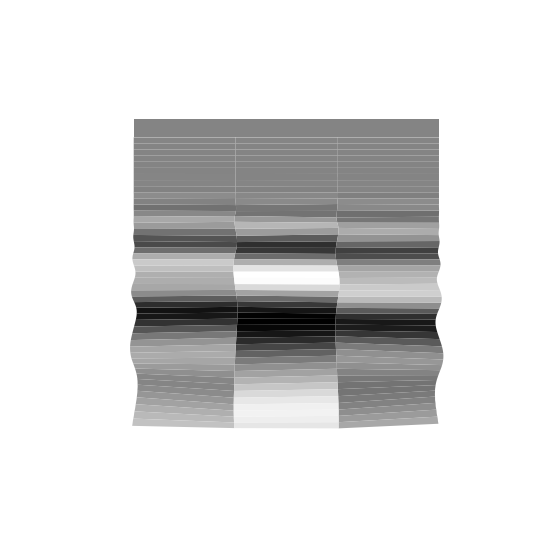

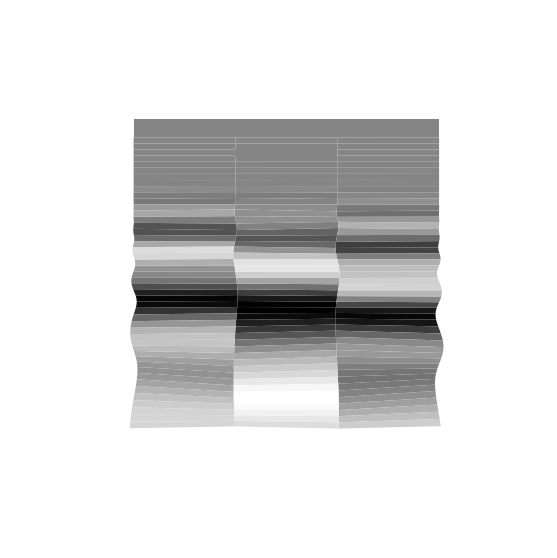

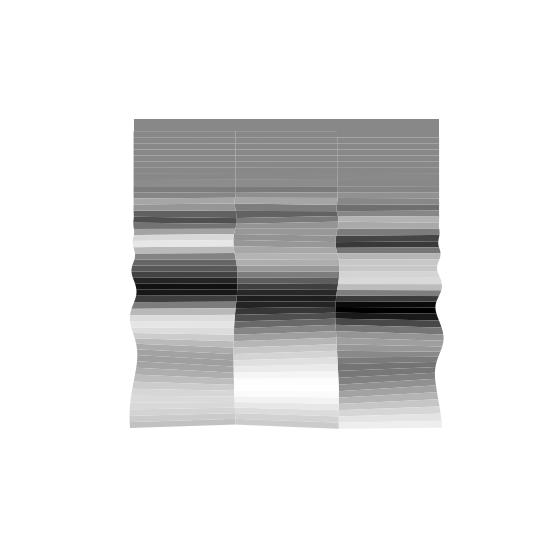

...

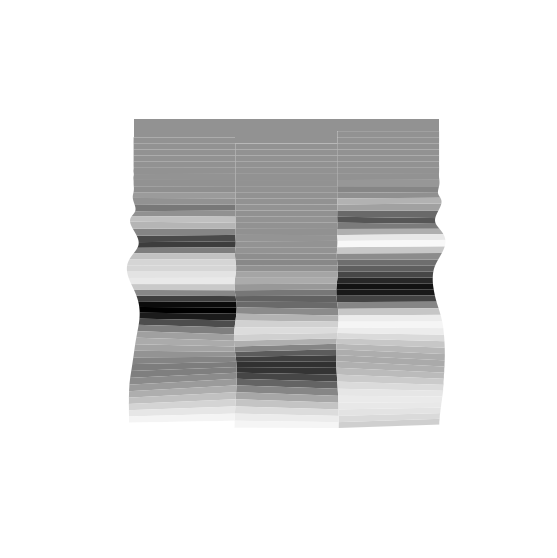

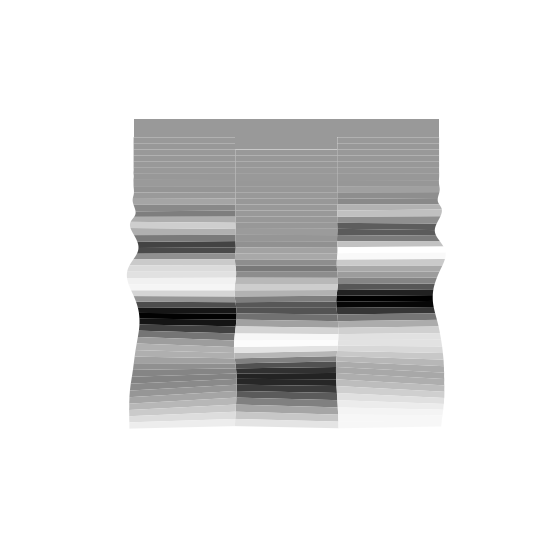

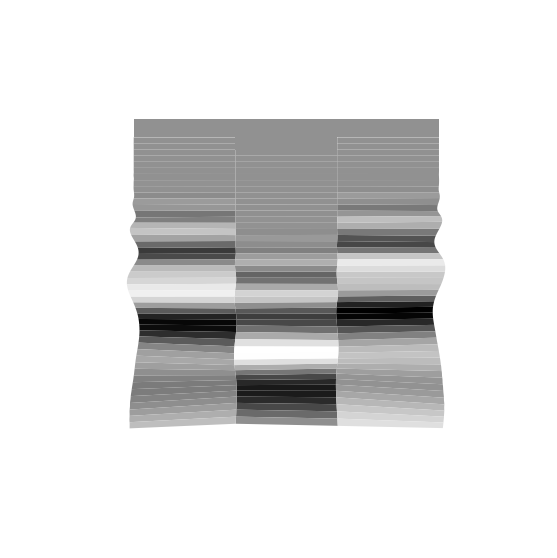

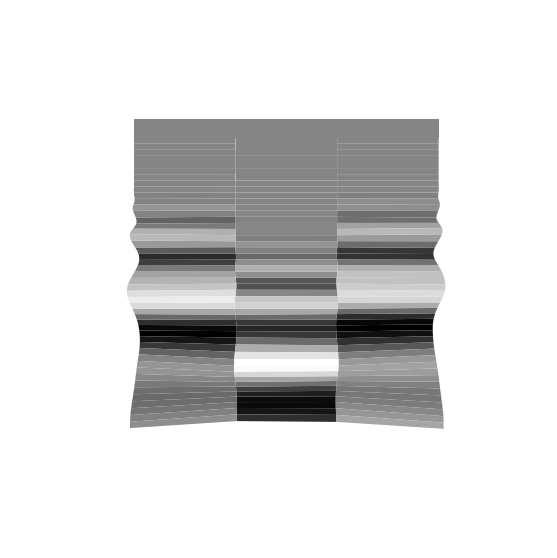

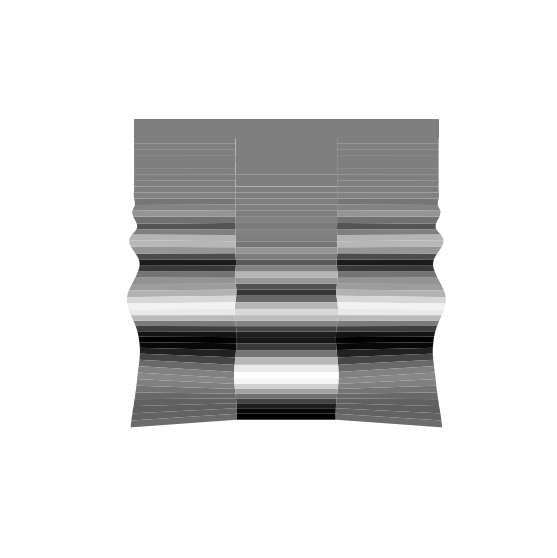

In [32]:
###############################----------------> Step 1 and 2
for f in range(fn.shape[0]):
    data = pd.read_csv(fn[f])
    timeSeries = data[' T']
    t = timeSeries.to_numpy()
    sensor = data[[' P1',' P2',' P3',' P4']]
    sd = sensor.to_numpy()
    s = np.linspace(1,4,4)
    X,Y = np.meshgrid(t,s)   

    
    ##################--------------> saving the plot according to the coordinates
    fig = plt.figure(figsize = [15,10])
    ax = plt.axes(projection = '3d')
    ax.plot_surface (X,Y,sd.T, cmap = cm.gray)
    ax.view_init(azim=0, elev=90)
    plt.axis('off')
    plt.grid(b = None)
    plt.savefig('%s.png' %(os.path.splitext(os.path.split(fn[f])[1])[0])) 

## Creating the data frame

In [23]:
####################----------------> creating a panda series containing the path names for all the images created.

image_dir = Path("Users\ratho\Desktop\CI\Project_B_Data\DATA\imgdata")
fp = glob.glob("DATA/imgdata/*.png")
im_paths = pd.Series(fp, name = 'image_paths').astype(str)
im_paths

0      DATA/imgdata\175_175.png
1      DATA/imgdata\175_180.png
2      DATA/imgdata\175_185.png
3      DATA/imgdata\175_190.png
4      DATA/imgdata\175_195.png
                 ...           
920    DATA/imgdata\325_305.png
921    DATA/imgdata\325_310.png
922    DATA/imgdata\325_315.png
923    DATA/imgdata\325_320.png
924    DATA/imgdata\325_325.png
Name: image_paths, Length: 925, dtype: object

In [10]:
###################------------------> extracting the x and y coordinates from 
#                                                                  image paths and storing them as separate panda series

x_coordi = []
y_coordi = []

for i in range(len(im_paths)):
    w = os.path.splitext(os.path.split(im_paths[i])[1])[0]
    x_coordi.append(w.split('_')[0])
    y_coordi.append(w.split('_')[1])
    
x = pd.Series(x_coordi, name = 'x').astype(int)
y = pd.Series(y_coordi, name = 'y').astype(int)

####################------------------> concatenating and shuffling the whole data set containing image paths, x and y coordis.

images = pd.concat([im_paths, x, y], axis = 1).sample(frac = 1.0, random_state = 1).reset_index(drop='True')
images

,image_paths,x,y
0,DATA/imgdata\295_315.png,295,315
1,DATA/imgdata\290_300.png,290,300
2,DATA/imgdata\255_195.png,255,195
3,DATA/imgdata\235_285.png,235,285
4,DATA/imgdata\195_325.png,195,325
...,...,...,...
920,DATA/imgdata\300_315.png,300,315
921,DATA/imgdata\185_225.png,185,225
922,DATA/imgdata\325_245.png,325,245
923,DATA/imgdata\210_265.png,210,265


In [11]:
###################-------------------> creating test and train splits from the same data set for first trial

train_df, test_df = train_test_split(images, train_size = 0.8, shuffle = True, random_state = 1)

## Loading images

In [12]:
train_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale = 1./255,
    validation_split = 0.2
)

test_generator = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale = 1./255
)

#train_df
#test_df

In [13]:
train_images = train_generator.flow_from_dataframe(
    dataframe = train_df,
    x_col = 'image_paths',
    y_col = ['x','y'],
    target_size = (120,120),
    color_mode = 'grayscale',
    class_mode = 'raw',
    batch_size = 32,
    shuffle = True,
    seed = 42,
    subset = 'training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe = train_df,
    x_col = 'image_paths',
    y_col = ['x','y'],
    target_size = (120,120),
    color_mode = 'grayscale',
    class_mode = 'raw',
    batch_size = 32,
    shuffle = True,
    seed = 42,
    subset = 'validation'
)

test_images = train_generator.flow_from_dataframe(
    dataframe = test_df,
    x_col = 'image_paths',
    y_col = ['x','y'],
    target_size = (120,120),
    color_mode = 'grayscale',
    class_mode = 'raw',
    batch_size = 32,
    shuffle = False,
)

Found 592 validated image filenames.
Found 148 validated image filenames.
Found 185 validated image filenames.


## Training

In [14]:
inputs = tf.keras.Input(shape=(120,120,1))
x_ = tf.keras.layers.Conv2D(filters=16, kernel_size = (3,3), activation='relu')(inputs)
x_ = tf.keras.layers.MaxPool2D()(x_)
x_ = tf.keras.layers.Conv2D(filters=32, kernel_size = (3,3), activation='relu')(inputs)
x_ = tf.keras.layers.MaxPool2D()(x_)
x_ = tf.keras.layers.Conv2D(filters=64, kernel_size = (3,3), activation='relu')(x_)
x_ = tf.keras.layers.MaxPool2D()(x_)
x_ = tf.keras.layers.GlobalAveragePooling2D()(x_)
x_ = tf.keras.layers.Dense(64, activation='relu')(x_)
x_ = tf.keras.layers.Dense(64, activation='relu')(x_)
outputs = tf.keras.layers.Dense(2, activation='linear')(x_)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

model.compile(optimizer='adam',loss='mse')

In [15]:
history = model.fit(
    train_images,
    validation_data = val_images,
    epochs = 100,
    callbacks = [
        tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            patience=5,
            restore_best_weights=True
        )
    ]
)

Epoch 1/100
19/19 [==============================] - 15s 734ms/step - loss: 64450.5352 - val_loss: 63305.8320
Epoch 2/100
19/19 [==============================] - 7s 387ms/step - loss: 61249.2109 - val_loss: 54365.1719
Epoch 3/100
19/19 [==============================] - 7s 386ms/step - loss: 37130.1289 - val_loss: 11244.1152
Epoch 4/100
19/19 [==============================] - 7s 389ms/step - loss: 6359.9937 - val_loss: 3616.6279
Epoch 5/100
19/19 [==============================] - 7s 385ms/step - loss: 3755.1140 - val_loss: 3538.6846
Epoch 6/100
19/19 [==============================] - 7s 383ms/step - loss: 3534.5635 - val_loss: 3501.7458
Epoch 7/100
19/19 [==============================] - 7s 384ms/step - loss: 3464.8098 - val_loss: 3529.6111
Epoch 8/100
19/19 [==============================] - 7s 387ms/step - loss: 3449.0813 - val_loss: 3437.9004
Epoch 9/100
19/19 [==============================] - 8s 398ms/step - loss: 3408.1829 - val_loss: 3444.7292
Epoch 10/100
19/19 [==========

In [16]:
predicted_coordi = model.predict(test_images)
predicted_coordi

array([[246.39491, 246.3776 ],
       [248.19658, 248.17014],
       [247.90938, 247.89975],
       [247.46883, 247.4381 ],
       [246.70848, 246.67673],
       [248.2313 , 248.2068 ],
       [247.58456, 247.57361],
       [247.22672, 247.21158],
       [245.43245, 245.39543],
       [246.9312 , 246.91678],
       [245.48741, 245.4573 ],
       [248.01494, 247.9753 ],
       [247.22615, 247.20651],
       [246.53535, 246.51083],
       [246.19339, 246.17218],
       [247.96394, 247.95276],
       [249.35185, 249.3237 ],
       [244.81215, 244.77419],
       [248.22145, 248.19507],
       [247.11739, 247.09866],
       [248.49995, 248.49417],
       [245.16817, 245.12772],
       [244.83272, 244.79514],
       [247.60213, 247.56656],
       [245.52516, 245.50974],
       [244.59196, 244.5583 ],
       [248.78741, 248.75565],
       [247.16452, 247.15186],
       [244.60255, 244.56342],
       [244.14348, 244.09793],
       [245.97498, 245.93591],
       [243.9598 , 243.91272],
       [

In [17]:
true_coordi = test_images.labels
true_coordi

array([[290, 270],
       [315, 190],
       [215, 235],
       [310, 320],
       [320, 290],
       [310, 190],
       [270, 265],
       [265, 260],
       [220, 210],
       [270, 210],
       [255, 190],
       [185, 175],
       [250, 240],
       [215, 275],
       [290, 225],
       [250, 235],
       [195, 185],
       [275, 305],
       [310, 185],
       [210, 230],
       [240, 205],
       [220, 205],
       [275, 195],
       [325, 195],
       [285, 240],
       [315, 255],
       [175, 295],
       [275, 230],
       [310, 275],
       [285, 300],
       [280, 325],
       [280, 190],
       [205, 245],
       [235, 325],
       [260, 275],
       [185, 240],
       [285, 225],
       [300, 180],
       [295, 235],
       [310, 245],
       [265, 235],
       [290, 240],
       [245, 210],
       [235, 285],
       [195, 245],
       [225, 305],
       [260, 280],
       [205, 195],
       [185, 200],
       [290, 305],
       [240, 180],
       [220, 285],
       [285,

In [18]:
rmse = np.sqrt(model.evaluate(train_images, verbose=0))
print("     Test RMSE: {:.5f}".format(rmse))

r2 = r2_score(true_coordi, predicted_coordi)
print("Test R^2 Score: {:.5f}".format(r2))

     Test RMSE: 46.20088
Test R^2 Score: -0.01572


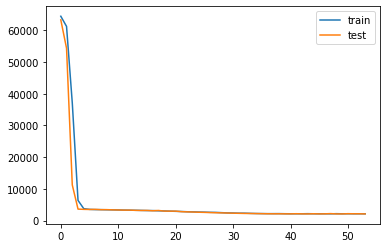

In [19]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['train', 'test'], loc='upper right')